In [1]:
import platform
print(platform.python_version())
import tensorflow as tf
print(tf.__version__)

3.8.7
2.4.1


In [2]:
import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12,12)
mpl.rcParams['axes.grid'] = False

import cv2 

import numpy as np
import time
import functools

In [3]:
content_path = tf.keras.utils.get_file('face4.jpg','http://spartacus-as-a-service.com/sample/face4.jpg')
style_path = tf.keras.utils.get_file('style1.jpg','http://spartacus-as-a-service.com/sample/style1.jpg')

style_predict_path = tf.keras.utils.get_file('style_predict_f16_256.tflite','http://spartacus-as-a-service.com/models/style_predict_f16_256.tflite')
style_transform_path = tf.keras.utils.get_file('style_transfer_f16_384.tflite','http://spartacus-as-a-service.com/models/style_transfer_f16_384.tflite')



425984/422086 [==============================] - 0s 0us/step


In [4]:
#The content image and the style image must be RGB images with pixel values being float32 numbers between [0..1].
#The style image size must be (1, 256, 256, 3). We central crop the image and resize it.
#The content image must be (1, 384, 384, 3). We central crop the image and resize it.

we'll use built in tensorflow operations here for clarity, but swiftr will have it's own UI handling (I'll spare you those details)
then we check the shape to make sure they're ready for the model
                                                                                                      
                                                                                                      
                                                                                                      
# Function to load an image from a file, and add a batch dimension.
def load_img(path_to_img):
  img = tf.io.read_file(path_to_img)
  img = tf.io.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)
  img = img[tf.newaxis, :]

  return img

# Function to pre-process by resizing an central cropping it.
def preprocess_image(image, target_dim):
  # Resize the image so that the shorter dimension becomes 256px.
  shape = tf.cast(tf.shape(image)[1:-1], tf.float32)
  short_dim = min(shape)
  scale = target_dim / short_dim
  new_shape = tf.cast(shape * scale, tf.int32)
  image = tf.image.resize(image, new_shape)

  # Central crop the image.
  image = tf.image.resize_with_crop_or_pad(image, target_dim, target_dim)

  return image

# Load the input images.
content_image = load_img(content_path)
style_image = load_img(style_path)

# Preprocess the input images.
preprocessed_content_image = preprocess_image(content_image, 384)
preprocessed_style_image = preprocess_image(style_image, 256)

print('Style Image Shape:', preprocessed_style_image.shape)
print('Content Image Shape:', preprocessed_content_image.shape)

Style Image Shape: (1, 256, 256, 3)
Content Image Shape: (1, 384, 384, 3)


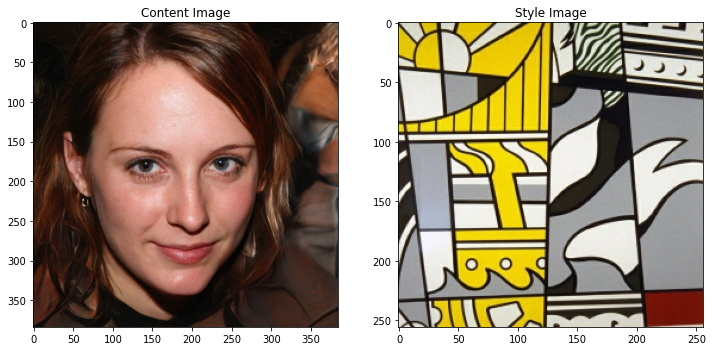

In [5]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

plt.subplot(1, 2, 1)
imshow(preprocessed_content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(preprocessed_style_image, 'Style Image')

In [6]:
# Function to run style prediction on preprocessed style image.
def run_style_predict(preprocessed_style_image):
  # Load the model.
  interpreter = tf.lite.Interpreter(model_path=style_predict_path)

  # Set model input.
  interpreter.allocate_tensors()
  input_details = interpreter.get_input_details()
  interpreter.set_tensor(input_details[0]["index"], preprocessed_style_image)

  # Calculate style bottleneck.
  interpreter.invoke()
  style_bottleneck = interpreter.tensor(
      interpreter.get_output_details()[0]["index"]
      )()

  return style_bottleneck

# Calculate style bottleneck for the preprocessed style image.
style_bottleneck = run_style_predict(preprocessed_style_image)
print('Style Bottleneck Shape:', style_bottleneck.shape)


Style Bottleneck Shape: (1, 1, 1, 100)


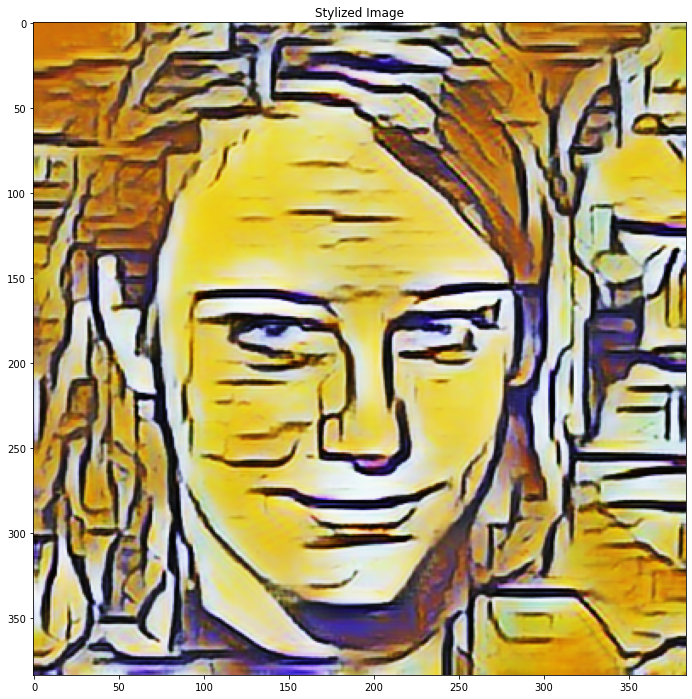

In [7]:
# Run style transform on preprocessed style image
def run_style_transform(style_bottleneck, preprocessed_content_image):
  # Load the model.
  interpreter = tf.lite.Interpreter(model_path=style_transform_path)

  # Set model input.
  input_details = interpreter.get_input_details()
  interpreter.allocate_tensors()

  # Set model inputs.
  interpreter.set_tensor(input_details[0]["index"], preprocessed_content_image)
  interpreter.set_tensor(input_details[1]["index"], style_bottleneck)
  interpreter.invoke()

  # Transform content image.
  stylized_image = interpreter.tensor(
      interpreter.get_output_details()[0]["index"]
      )()

  return stylized_image

# Stylize the content image using the style bottleneck.
stylized_image = run_style_transform(style_bottleneck, preprocessed_content_image)

# Visualize the output.
imshow(stylized_image, 'Stylized Image')

In [8]:
# Calculate style bottleneck of the content image.
style_bottleneck_content = run_style_predict(
    preprocess_image(content_image, 256)
    )

ratio : 0.100000 


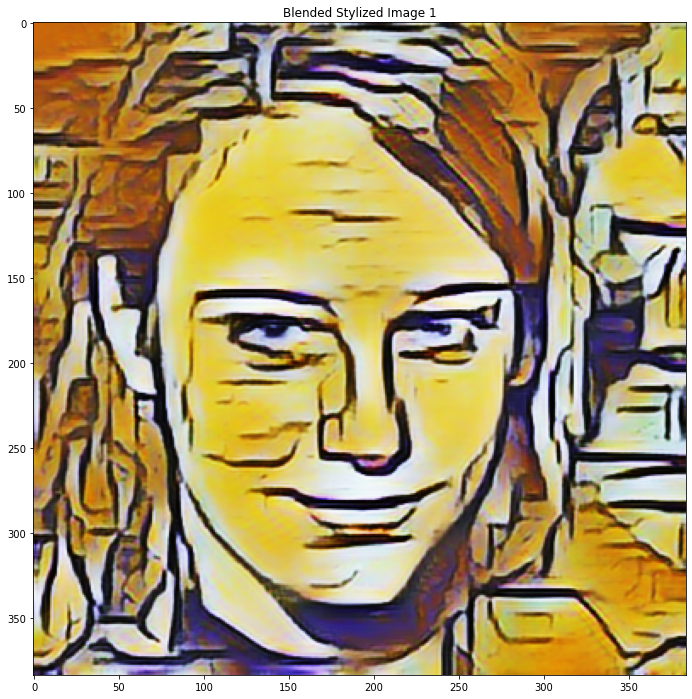

ratio : 0.200000 


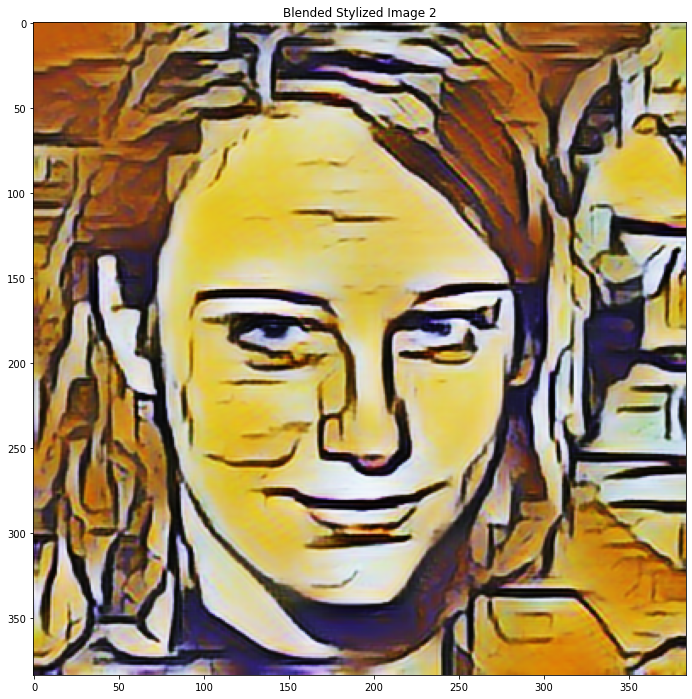

ratio : 0.300000 


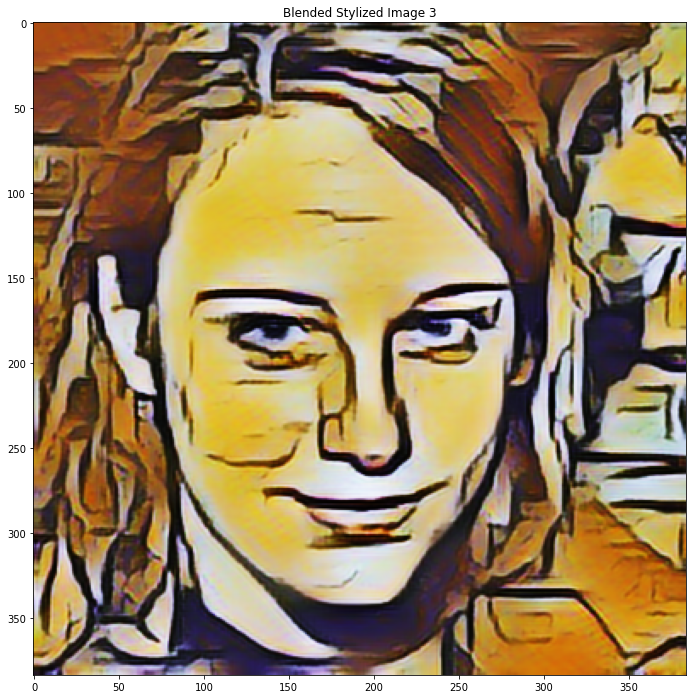

ratio : 0.400000 


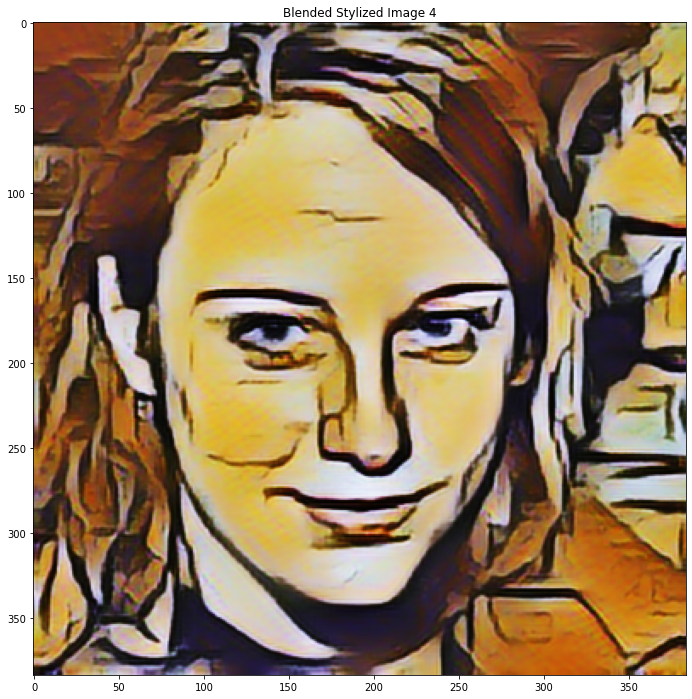

ratio : 0.500000 


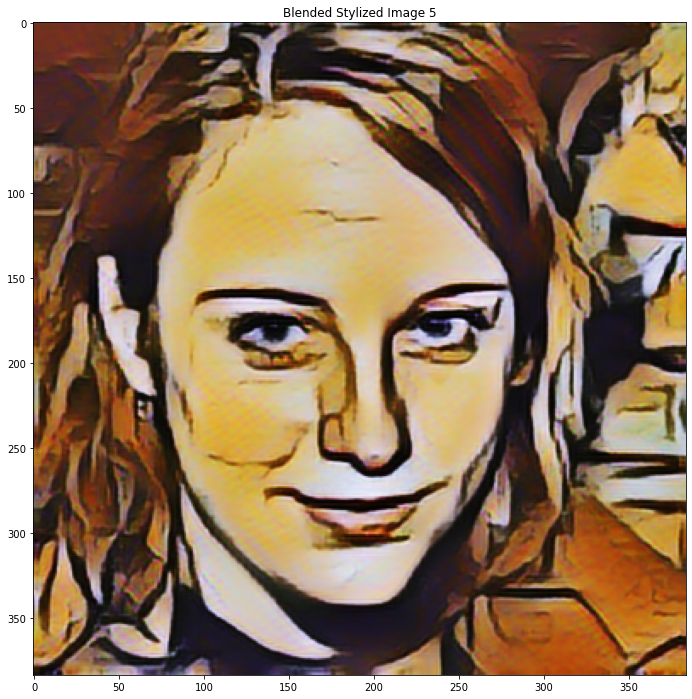

ratio : 0.600000 


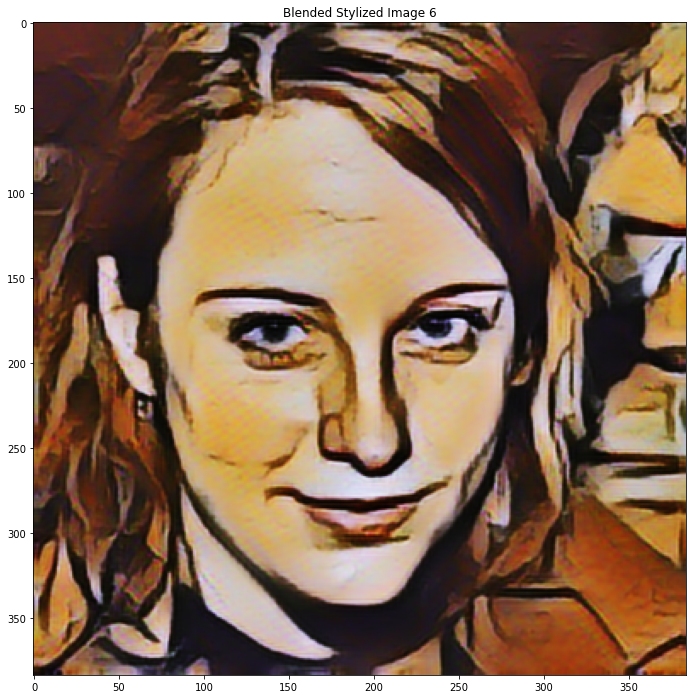

ratio : 0.700000 


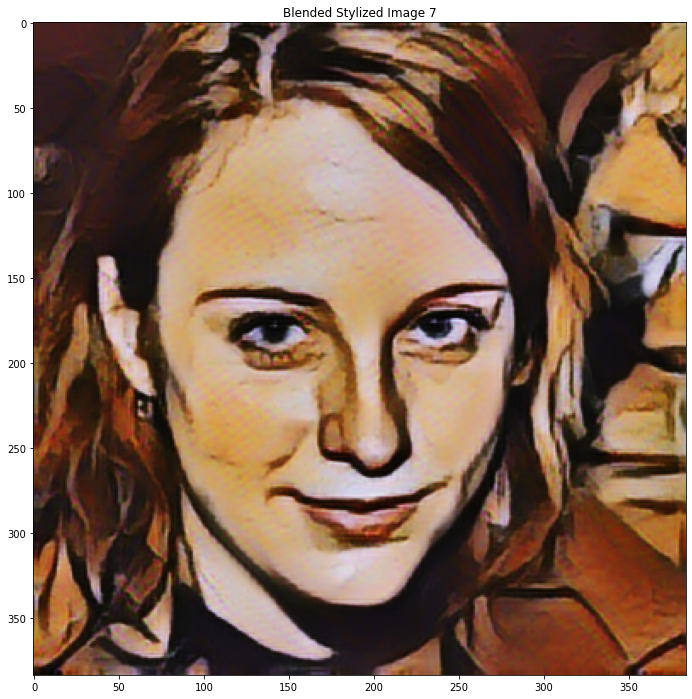

ratio : 0.800000 


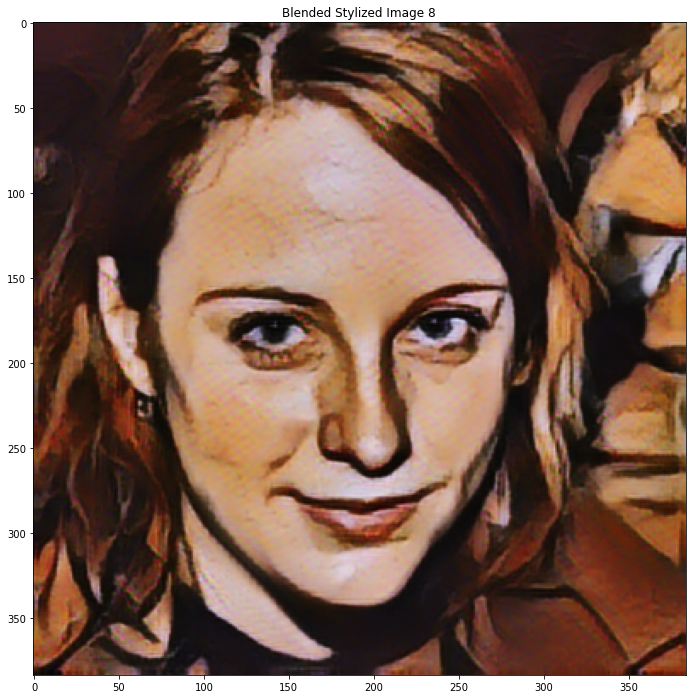

ratio : 0.900000 


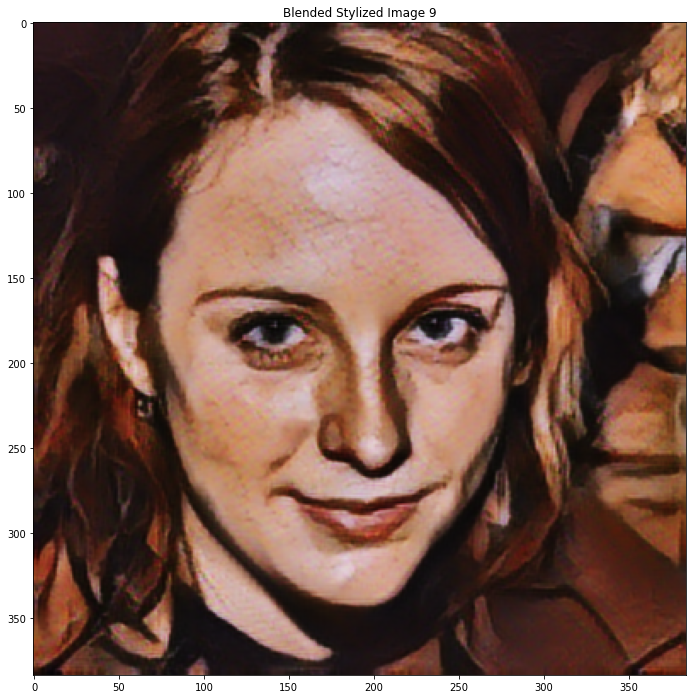

ratio : 1.000000 


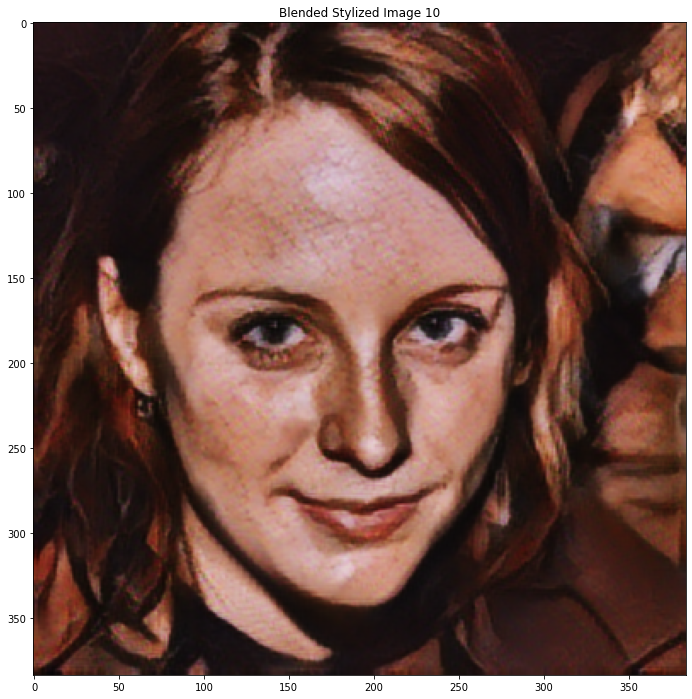

In [9]:
def imshow(image, title=None):
  if len(image.shape) > 3:
   image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
   plt.title(title)
  plt.show()

def imwrite(image, title=None):
   if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)
    image= tf.image.convert_image_dtype(image, tf.uint8)
    image = tf.io.encode_jpeg(image)
    tf.io.write_file(title,image)

for x in range (1,11):
    
    print("ratio : %f " % (x/10))
    
    # Define content blending ratio between [0..1].
    # 0.0: 0% style extracts from content image.
    # 1.0: 100% style extracted from content image.
    content_blending_ratio = x / 10

    # Blend the style bottleneck of style image and content image
    style_bottleneck_blended = content_blending_ratio * style_bottleneck_content + (1 - content_blending_ratio) * style_bottleneck
        
    # Stylize the content image using the style bottleneck.
    stylized_image_blended = run_style_transform(style_bottleneck_blended,
                                             preprocessed_content_image)

    # Visualize the output.
    imshow(stylized_image_blended, 'Blended Stylized Image %d' % (x))
    imwrite(stylized_image_blended,"face4 %d.jpg" % (x))
